In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [5]:
airbnb = pd.read_csv('AB_NYC_2019.csv')

In [3]:
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
id                                48895 non-null int64
name                              48879 non-null object
host_id                           48895 non-null int64
host_name                         48874 non-null object
neighbourhood_group               48895 non-null object
neighbourhood                     48895 non-null object
latitude                          48895 non-null float64
longitude                         48895 non-null float64
room_type                         48895 non-null object
price                             48895 non-null int64
minimum_nights                    48895 non-null int64
number_of_reviews                 48895 non-null int64
last_review                       38843 non-null object
reviews_per_month                 38843 non-null float64
calculated_host_listings_count    48895 non-null int64
availability_365                  48895 non-null int64

In [9]:
airbnb.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [4]:
airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [5]:
airbnb[airbnb['availability_365'] == 0].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17533 entries, 4 to 48779
Data columns (total 16 columns):
id                                17533 non-null int64
name                              17521 non-null object
host_id                           17533 non-null int64
host_name                         17520 non-null object
neighbourhood_group               17533 non-null object
neighbourhood                     17533 non-null object
latitude                          17533 non-null float64
longitude                         17533 non-null float64
room_type                         17533 non-null object
price                             17533 non-null int64
minimum_nights                    17533 non-null int64
number_of_reviews                 17533 non-null int64
last_review                       12688 non-null object
reviews_per_month                 12688 non-null float64
calculated_host_listings_count    17533 non-null int64
availability_365                  17533 non-null int64

# [MISSING DATA CHECKING]

In [6]:
airbnb.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

# [VISUALIZATION]

# NEIGHBOURHOOD-GROUP MAP

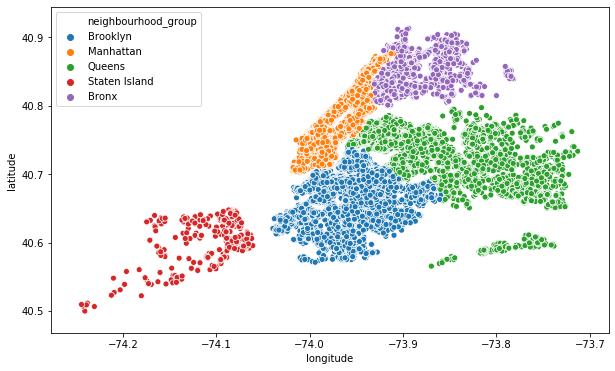

In [7]:
plt.figure(figsize=(10,6))
sns.scatterplot(airbnb.longitude,airbnb.latitude,hue=airbnb.neighbourhood_group)
plt.ioff()

# ROOM TYPE MAP

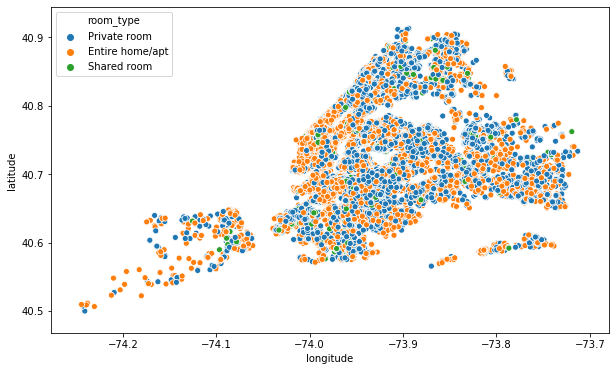

In [8]:
plt.figure(figsize=(10,6))
sns.scatterplot(airbnb.longitude,airbnb.latitude,hue=airbnb.room_type)
plt.ioff()

# ----- ON PRICE -----

Text(0.5, 1.0, 'Room-Type Price')

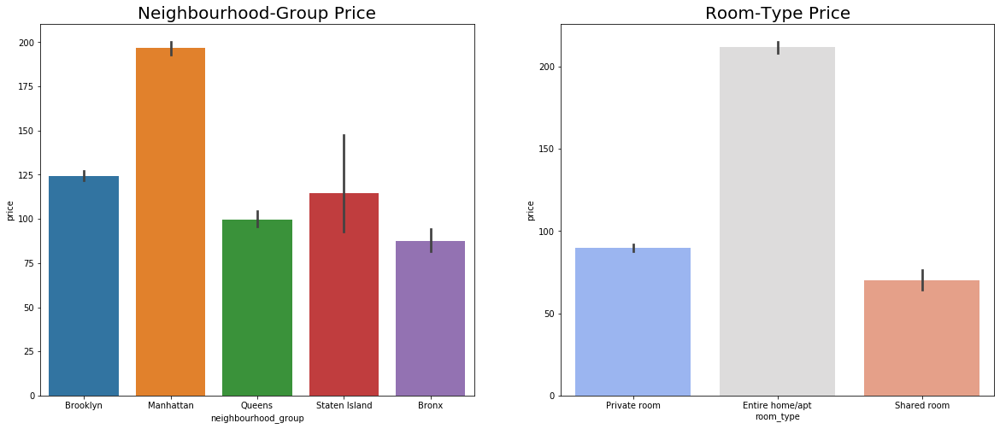

In [9]:
plt.figure(figsize= (20,8))
plt.subplot(1,2,1)
sns.barplot(data= airbnb, x = 'neighbourhood_group', y = 'price')
plt.title('Neighbourhood-Group Price',fontsize = 20)
plt.subplot(1,2,2)
sns.barplot(data= airbnb, x = 'room_type', y = 'price', palette = 'coolwarm')
plt.title('Room-Type Price',fontsize = 20)

# ----- ON MINIMUM NIGHTS -----

Text(0.5, 1.0, 'Room-Type Min.Nights')

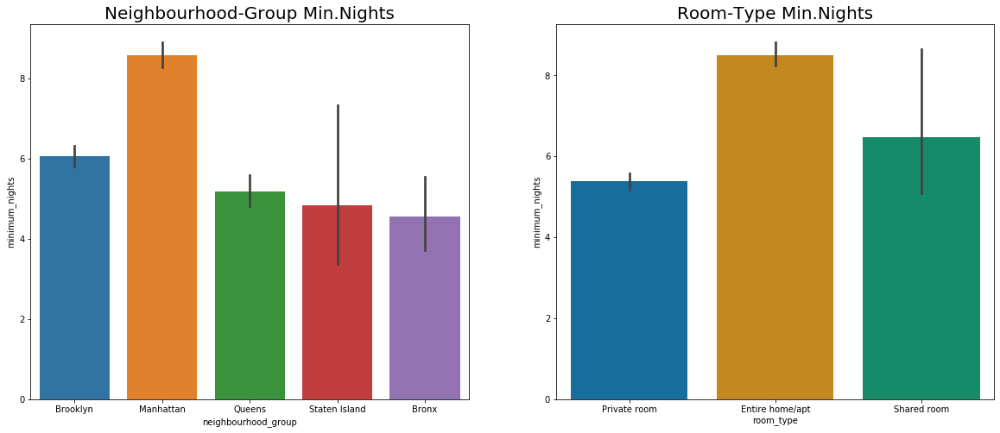

In [10]:
plt.figure(figsize= (20,8))
plt.subplot(1,2,1)
sns.barplot(data= airbnb, x = 'neighbourhood_group', y = 'minimum_nights')
plt.title('Neighbourhood-Group Min.Nights',fontsize = 20)
plt.subplot(1,2,2)
sns.barplot(data= airbnb, x = 'room_type', y = 'minimum_nights', palette = 'colorblind')
plt.title('Room-Type Min.Nights',fontsize = 20)



 # ----- ON NUMBER OF REVIEWS -----

Text(0.5, 1.0, 'Room-Type Reviews')

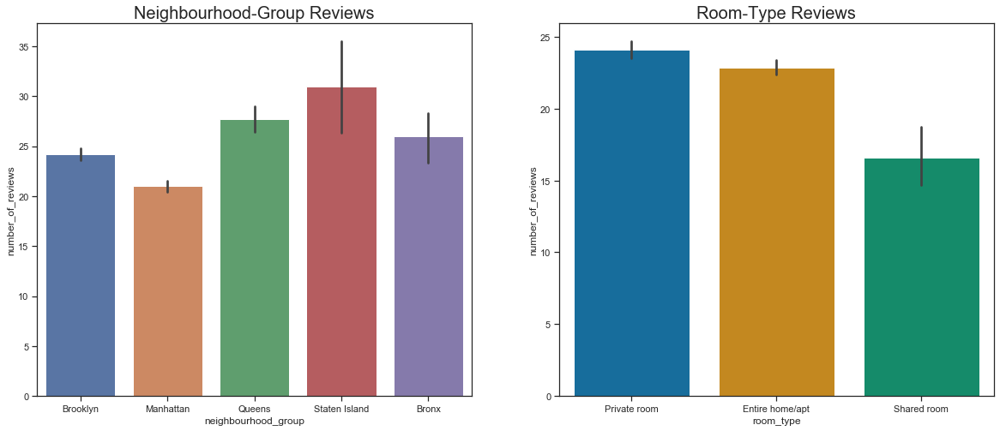

In [124]:
plt.figure(figsize= (20,8))
plt.subplot(1,2,1)
sns.barplot(data= airbnb, x = 'neighbourhood_group', y = 'number_of_reviews')
plt.title('Neighbourhood-Group Reviews',fontsize = 20)
plt.subplot(1,2,2)
sns.barplot(data= airbnb, x = 'room_type', y = 'number_of_reviews', palette = 'colorblind')
plt.title('Room-Type Reviews',fontsize = 20)

# ----- ON TOTAL COUNTS -----

Text(0.5, 1.0, 'Room-Type Frequency')

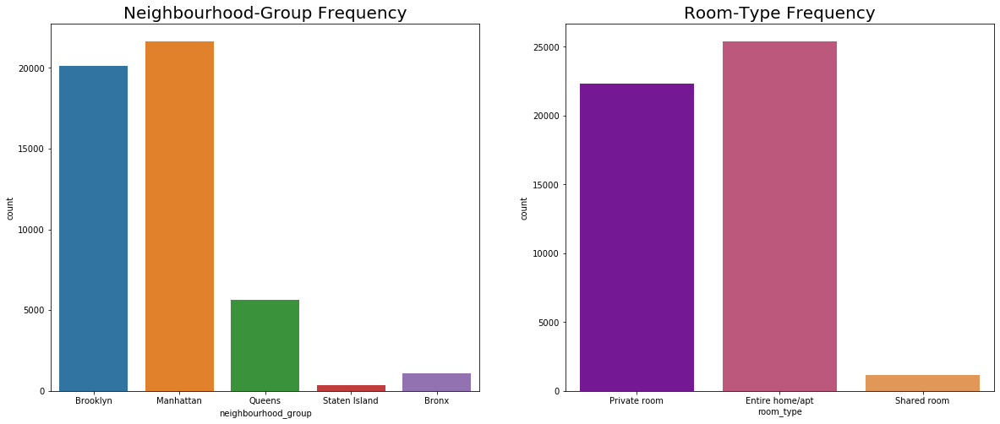

In [11]:
plt.figure(figsize= (20,8))
plt.subplot(1,2,1)
sns.countplot(data= airbnb, x = 'neighbourhood_group')
plt.title('Neighbourhood-Group Frequency',fontsize = 20)
plt.subplot(1,2,2)
sns.countplot(data= airbnb, x = 'room_type',palette = 'plasma')
plt.title('Room-Type Frequency',fontsize = 20)

In [21]:
# plt.figure(figsize= (20,8))
# plt.subplot(1,2,1)
a =  airbnb['host_id'].nunique()
a


sns.barplot(data= airbnb, x= 'room_type', y = 'calculated_host_listings_count',estimator = np.mean )
# plt.title('Neighbourhood-Group Frequency',fontsize = 20)
# plt.subplot(1,2,2)
# sns.countplot(data= airbnb, x = 'room_type',palette = 'plasma')
# plt.title('Room-Type Frequency',fontsize = 20)

37457

In [19]:
b = px.histogram(airbnb, x ='neighbourhood_group', facet_col='room_type', color= 'room_type')
b.show()

# [ON NUMBER OF REVIEWS & POPULARITY]

In [13]:
airbnb['number_of_reviews'].describe()

count    48895.000000
mean        23.274466
std         44.550582
min          0.000000
25%          1.000000
50%          5.000000
75%         24.000000
max        629.000000
Name: number_of_reviews, dtype: float64

In [14]:
airbnb_rev24 = airbnb[airbnb['number_of_reviews']>=24]
airbnb_rev24.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0
7,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,2019-06-24,3.47,1,220


In [15]:
Q1_rev = airbnb['number_of_reviews'].describe()['25%']
Q3_rev = airbnb['number_of_reviews'].describe()['75%']
IQR_rev = Q3_rev - Q1_rev

In [16]:
airbnb_out = airbnb[(airbnb['number_of_reviews']> Q3_rev + 1.5*IQR_rev)]
airbnb_out.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
7,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,2019-06-24,3.47,1,220
8,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,2017-07-21,0.99,1,0
9,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,2019-06-09,1.33,4,188


Text(0.5, 1.0, 'Very Popular Number of Reviews')

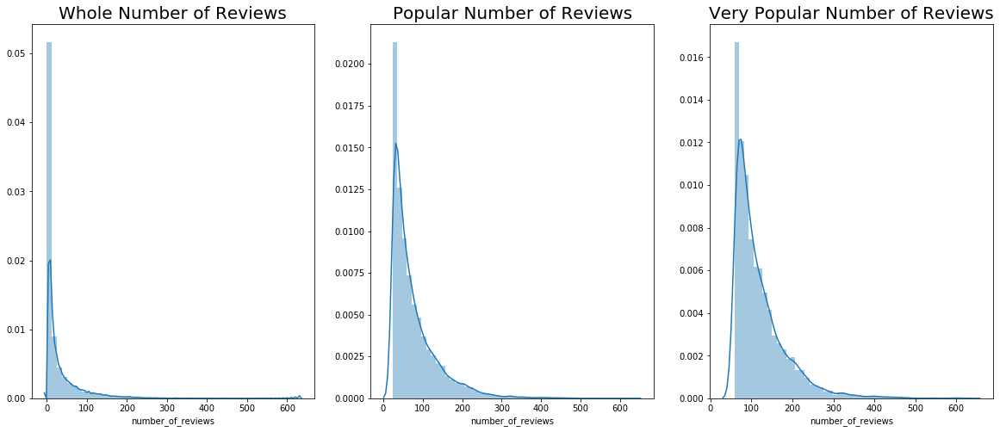

In [17]:
plt.figure(figsize= (20,8))
plt.subplot(1,3,1)
sns.distplot(airbnb['number_of_reviews'])
plt.title('Whole Number of Reviews',fontsize = 20)
plt.subplot(1,3,2)
sns.distplot(airbnb_rev24['number_of_reviews'])
plt.title('Popular Number of Reviews',fontsize = 20)
plt.subplot(1,3,3)
sns.distplot(airbnb_out['number_of_reviews'])
plt.title('Very Popular Number of Reviews',fontsize = 20)

# ----- NORMALITY, EQUAL VARIANCE, AND ANOVA -----

In [18]:
from scipy.stats import shapiro, normaltest, anderson
def try_normal(data):
    result = {'Anderson' : {i:j for i,j in zip(anderson(data)[2], anderson(data)[1])}, 'Shapiro': shapiro(data)[1], 
     'K^2': normaltest(data)[1]}
    result['Anderson']['stat'] = anderson(data)[0]
    return result

In [19]:
from scipy.stats import levene, bartlett, f_oneway, kruskal
def try_equal_var(x1,x2):
    result = {'Bartlett': {'Bartlett-Stat': bartlett(x1,x2)[0], 'P-Value': bartlett(x1,x2)[1]},
              'Levene': {'Levene-Stat':levene(x1,x2)[0], 'P-Value': levene(x1,x2)[1]}}
    return result

In [20]:
from pingouin import pairwise_tukey, pairwise_gameshowell, pairwise_ttests, welch_anova

In [21]:
from scipy.stats import mannwhitneyu

# ----- NEIGHBOURHOOD-GROUP -----

In [22]:
print(try_normal(airbnb[(airbnb['neighbourhood_group']== 'Brooklyn')]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['neighbourhood_group']== 'Bronx')]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['neighbourhood_group']== 'Manhattan')]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['neighbourhood_group']== 'Queens')]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['neighbourhood_group']== 'Staten Island')]['number_of_reviews']))

print(try_normal(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Brooklyn')]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Bronx')]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Manhattan')]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Queens')]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Staten Island')]['number_of_reviews']))

print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Brooklyn')]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Bronx')]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Manhattan')]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Queens')]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Staten Island')]['number_of_reviews'])))

{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 2815.862750392698}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.574, 10.0: 0.654, 5.0: 0.784, 2.5: 0.915, 1.0: 1.088, 'stat': 120.92411636092902}, 'Shapiro': 8.239634970229924e-43, 'K^2': 1.462763705005451e-153}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 3406.39413713682}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.786, 2.5: 0.917, 1.0: 1.091, 'stat': 736.3498982266292}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.57, 10.0: 0.649, 5.0: 0.779, 2.5: 0.908, 1.0: 1.081, 'stat': 34.076719960107425}, 'Shapiro': 3.423165755783757e-25, 'K^2': 7.136114724739209e-49}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.786, 2.5: 0.917, 1.0: 1.091, 'stat': 282.17313897839995}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.57, 10.0: 0.649, 5.0: 0.778, 2.5: 0.908, 1.0: 1.08, 'stat': 21.100097947595657}, 'Shapiro': 3.6144606022945706e-

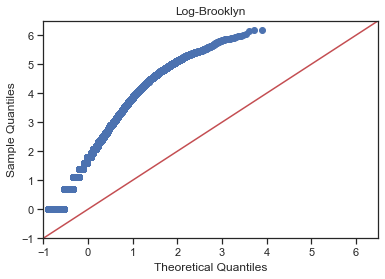

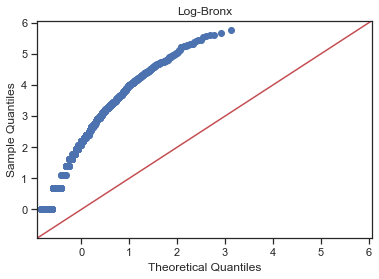

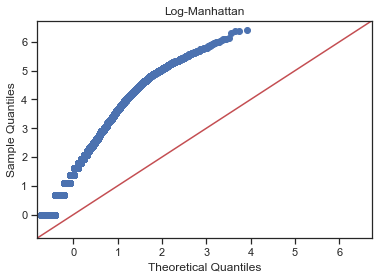

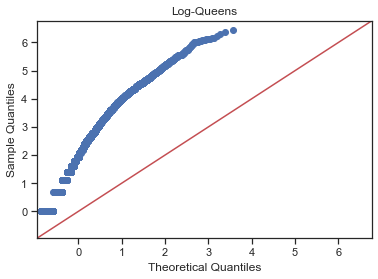

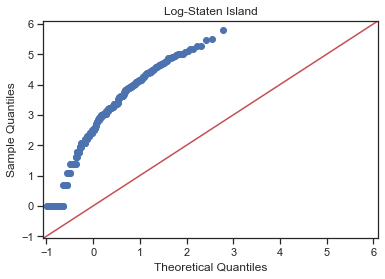

In [23]:
import statsmodels.api as sm
import pylab

sm.qqplot(np.log(airbnb[(airbnb['neighbourhood_group']== 'Brooklyn')]['number_of_reviews']), line = '45')
plt.title('Log-Brooklyn')

sm.qqplot(np.log(airbnb[(airbnb['neighbourhood_group']== 'Bronx')]['number_of_reviews']), line = '45')
plt.title('Log-Bronx')

sm.qqplot(np.log(airbnb[(airbnb['neighbourhood_group']== 'Manhattan')]['number_of_reviews']), line = '45')
plt.title('Log-Manhattan')

sm.qqplot(np.log(airbnb[(airbnb['neighbourhood_group']== 'Queens')]['number_of_reviews']), line = '45')
plt.title('Log-Queens')

sm.qqplot(np.log(airbnb[(airbnb['neighbourhood_group']== 'Staten Island')]['number_of_reviews']), line = '45')
plt.title('Log-Staten Island')


pylab.show()

- DISTRIBUSI DATA NEIGHBOURHOOD-GROUP TERHADAP NUMBER OF REVIEWS TIDAK NORMAL

In [24]:
print(levene(airbnb[(airbnb['neighbourhood_group']== 'Brooklyn')]['number_of_reviews'],
       airbnb[(airbnb['neighbourhood_group']== 'Bronx')]['number_of_reviews'],
      airbnb[(airbnb['neighbourhood_group']== 'Manhattan')]['number_of_reviews'],
      airbnb[(airbnb['neighbourhood_group']== 'Queens')]['number_of_reviews'],
      airbnb[(airbnb['neighbourhood_group']== 'Staten Island')]['number_of_reviews']))

print(levene(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Brooklyn')]['number_of_reviews'],
       airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Bronx')]['number_of_reviews'],
      airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Manhattan')]['number_of_reviews'],
      airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Queens')]['number_of_reviews'],
      airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Staten Island')]['number_of_reviews']))

LeveneResult(statistic=28.033759815300257, pvalue=2.7131828968166394e-23)
LeveneResult(statistic=1.9268474934320532, pvalue=0.10297787740552963)


- DATA NEIGHBOURHOOD-GROUP TERHADAP NUMBER OF REVIEWS SECARA KESELURUHAN & SANGAT POPULER MEMILIKI UNEQUAL VARIANCE SEDANGKAN UNTUK AIRBNB POPULAR MEMILIKI EQUAL VARIANCE

In [25]:
print(kruskal(airbnb[(airbnb['neighbourhood_group']== 'Brooklyn')]['number_of_reviews'],
       airbnb[(airbnb['neighbourhood_group']== 'Bronx')]['number_of_reviews'],
      airbnb[(airbnb['neighbourhood_group']== 'Manhattan')]['number_of_reviews'],
      airbnb[(airbnb['neighbourhood_group']== 'Queens')]['number_of_reviews'],
      airbnb[(airbnb['neighbourhood_group']== 'Staten Island')]['number_of_reviews']))

print(kruskal(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Brooklyn')]['number_of_reviews'],
       airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Bronx')]['number_of_reviews'],
      airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Manhattan')]['number_of_reviews'],
      airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Queens')]['number_of_reviews'],
      airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Staten Island')]['number_of_reviews']))

print(f_oneway(airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Brooklyn')]['number_of_reviews'],
       airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Bronx')]['number_of_reviews'],
      airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Manhattan')]['number_of_reviews'],
      airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Queens')]['number_of_reviews'],
      airbnb_rev24[(airbnb_rev24['neighbourhood_group']== 'Staten Island')]['number_of_reviews']))

KruskalResult(statistic=-334787.03913411516, pvalue=1.0)
KruskalResult(statistic=8.57921701459058, pvalue=0.07252207575149663)
F_onewayResult(statistic=2.0833624857388995, pvalue=0.08016916658205109)


- SECARA KRUSKAL & F-TEST, NEIGHBOURHOOD-GROUP TIDAK MEMILIKI PENGARUH/HUBUNGAN TERHADAP NUMBER OF REVIEWS 

In [26]:
pairwise_ttests(data = airbnb_out, dv = 'number_of_reviews', between = 'neighbourhood_group', parametric = False)

,Contrast,A,B,Paired,Parametric,U-val,Tail,p-unc,hedges
0,neighbourhood_group,Brooklyn,Manhattan,False,False,3057402.0,two-sided,0.778514,-0.031
1,neighbourhood_group,Brooklyn,Queens,False,False,1143703.5,two-sided,0.023257,-0.055
2,neighbourhood_group,Brooklyn,Staten Island,False,False,98401.0,two-sided,0.129299,0.182
3,neighbourhood_group,Brooklyn,Bronx,False,False,228109.0,two-sided,0.018178,0.160
4,neighbourhood_group,Manhattan,Queens,False,False,1031736.0,two-sided,0.018366,-0.024
5,neighbourhood_group,Manhattan,Staten Island,False,False,88766.0,two-sided,0.119836,0.199
6,neighbourhood_group,Manhattan,Bronx,False,False,205683.5,two-sided,0.016157,0.179
7,neighbourhood_group,Queens,Staten Island,False,False,29712.0,two-sided,0.489741,0.181
8,neighbourhood_group,Queens,Bronx,False,False,68881.5,two-sided,0.276913,0.169
9,neighbourhood_group,Staten Island,Bronx,False,False,5368.0,two-sided,0.947538,-0.024


- SECARA PAIRWISE T-TEST, MASING2 NEIGHBOURHOOD-GROUP MEMILIKI PERBEDAAN MEDIAN KECUALI ANTARA QUEENS & BRONX. PERLU DICATAT BAHWA DENGAN SEMAKIN BANYAK KATEGORI SEMAKIN TINGGI ERROR RATE

In [27]:
airbnb_rev24.groupby('neighbourhood_group').mean()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
neighbourhood_group,,,,,,,,,,
Bronx,1.717282e+07,8.394500e+07,40.846638,-73.884654,79.982659,2.378613,70.046243,2.786156,2.271676,180.820809
Brooklyn,1.326472e+07,4.646284e+07,40.682589,-73.949650,120.562190,4.065433,78.475391,2.474285,2.153186,153.525181
Manhattan,1.278323e+07,4.781356e+07,40.768806,-73.972061,165.992900,4.261641,78.692003,2.469505,1.793276,138.316768
Queens,1.653322e+07,7.950438e+07,40.729699,-73.862753,89.689756,3.104191,79.243888,3.198644,2.480210,180.108847
Staten Island,1.623369e+07,8.188063e+07,40.615733,-74.101183,85.028571,3.042857,72.014286,2.733357,2.414286,222.900000


In [28]:
airbnb_out.groupby('neighbourhood_group').mean()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
neighbourhood_group,,,,,,,,,,
Bronx,1.305471e+07,5.876618e+07,40.847302,-73.884030,77.152866,2.108280,109.910828,3.180318,2.292994,183.070064
Brooklyn,1.014447e+07,3.482196e+07,40.683098,-73.949487,121.202832,3.291619,119.337926,2.988270,2.137390,168.782625
Manhattan,1.013548e+07,3.826904e+07,40.768896,-73.972018,155.619736,3.760102,121.268396,3.084977,1.783496,156.388345
Queens,1.397691e+07,6.886065e+07,40.731381,-73.864189,86.933894,2.450721,122.920673,4.093149,2.585337,189.479567
Staten Island,1.222790e+07,5.892978e+07,40.618875,-74.099652,83.764706,3.220588,108.617647,3.154853,2.073529,228.220588


In [29]:
airbnb_rev24.groupby('neighbourhood_group').median()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
neighbourhood_group,,,,,,,,,,
Bronx,18574718.0,69630008.5,40.846025,-73.894250,65.0,2.0,54.0,2.560,2.0,169.5
Brooklyn,13492524.5,19240983.5,40.685030,-73.950485,99.0,2.0,58.0,2.210,1.0,134.0
Manhattan,12342979.0,20175896.0,40.763650,-73.979120,130.0,2.0,57.0,2.080,1.0,113.0
Queens,17698589.5,60331359.5,40.744725,-73.875775,70.0,2.0,57.0,2.575,2.0,168.0
Staten Island,17735397.5,72603148.0,40.628990,-74.085690,70.0,2.0,56.0,2.290,1.0,263.0


In [30]:
airbnb_rev24.groupby('neighbourhood_group').max()

,id,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
neighbourhood_group,,,,,,,,,,,,,
Bronx,33363084,248404100,Woodlawn,40.90804,-73.78414,Shared room,450,30,321,2019-07-07,10.34,13,365
Brooklyn,34392081,259630588,Windsor Terrace,40.73890,-73.85676,Shared room,2000,999,488,2019-07-08,14.00,34,365
Manhattan,33877798,250896604,West Village,40.87665,-73.90855,Shared room,2990,365,607,2019-07-08,58.50,30,365
Queens,33636410,252191305,Woodside,40.78824,-73.71299,Shared room,900,500,629,2019-07-08,20.94,12,365
Staten Island,31957975,236334741,West Brighton,40.64779,-74.06640,Private room,299,30,333,2019-07-08,10.12,8,363


In [31]:
airbnb_rev24.groupby('neighbourhood_group').count()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
neighbourhood_group,,,,,,,,,,,,,,,
Bronx,346,346,346,345,346,346,346,346,346,346,346,346,346,346,346
Brooklyn,5242,5242,5242,5239,5242,5242,5242,5242,5242,5242,5242,5242,5242,5242,5242
Manhattan,4789,4788,4789,4784,4789,4789,4789,4789,4789,4789,4789,4789,4789,4789,4789
Queens,1718,1718,1718,1717,1718,1718,1718,1718,1718,1718,1718,1718,1718,1718,1718
Staten Island,140,140,140,140,140,140,140,140,140,140,140,140,140,140,140


- Terdapat perbedaan mean number of views yang tidak signifikan diantara masing2 neighbourhood-group (Queens > Manhattan > Brooklyn > Staten Island > Bronx)
- Terdapat perbedaan median number of reviews yang tidak signifikan diantara masing2 neighbourhood-group (Brooklyn > Manhattan = Queens > Staten Island > Bronx)
- Modus terbesar diraih oleh kategori Brooklyn (total 5242 frekuensi)
- Jumlah number of reviews terbanyak berdasarkan neighbourhood-group diraih oleh individu kategori Queens (629 number of reviews)

Text(0.5, 1.0, 'Number of Reviews')

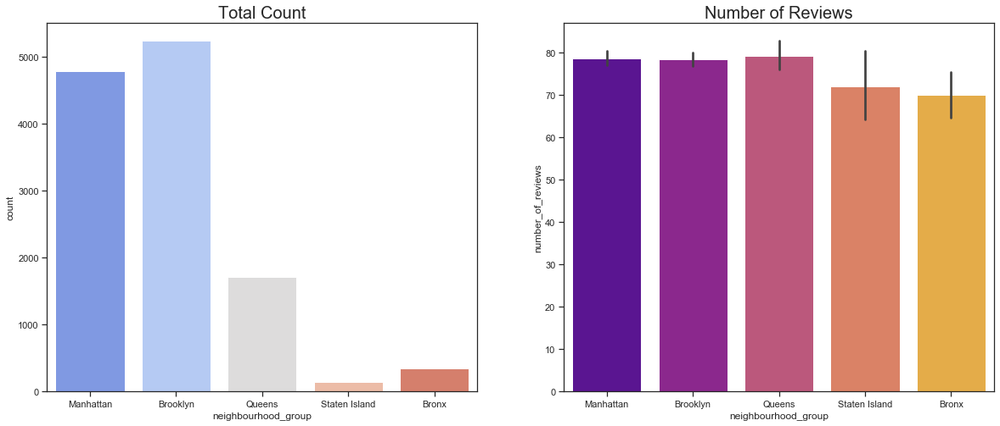

In [32]:
plt.figure(figsize= (20,8))
plt.subplot(1,2,1)
sns.countplot(data= airbnb_rev24, x = 'neighbourhood_group', palette = 'coolwarm')
plt.title('Total Count',fontsize = 20)
plt.subplot(1,2,2)
sns.barplot(data= airbnb_rev24, x = 'neighbourhood_group', y = 'number_of_reviews', palette = 'plasma')
plt.title('Number of Reviews',fontsize = 20)

In [33]:
i = px.box(airbnb_rev24, x = 'neighbourhood_group', y = 'number_of_reviews', color = 'neighbourhood_group')
i.show()

- REKOMENDASI INVESTASI: TIDAK TERLALU BERPENGARUH, TAPI KALAU TETAP DIMINTA, REKOMENDASI KAMI ADALAH DAERAH BROOKLYN, QUEENS, ATAU MANHATTAN 

# ----- ROOM TYPE -----

In [34]:
airbnb['room_type'].value_counts()

Entire home/apt    25409
Private room       22326
Shared room         1160
Name: room_type, dtype: int64

In [35]:
print(try_normal(airbnb[(airbnb['room_type'] == 'Entire home/apt')]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['room_type']== 'Private room')]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['room_type']== 'Shared room')]['number_of_reviews']))


print(try_normal(airbnb_rev24[(airbnb_rev24['room_type'] == 'Entire home/apt')]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['room_type']== 'Private room')]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['room_type']== 'Shared room')]['number_of_reviews']))

print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['room_type'] == 'Entire home/apt')]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['room_type']== 'Private room')]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['room_type']== 'Shared room')]['number_of_reviews'])))

{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 3633.7722236457957}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 3265.9155698208706}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.574, 10.0: 0.654, 5.0: 0.784, 2.5: 0.915, 1.0: 1.088, 'stat': 177.68740974961338}, 'Shapiro': 0.0, 'K^2': 6.143874524872709e-247}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.786, 2.5: 0.917, 1.0: 1.091, 'stat': 324.6016670852259}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.786, 2.5: 0.917, 1.0: 1.091, 'stat': 385.24386224500176}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.566, 10.0: 0.645, 5.0: 0.773, 2.5: 0.902, 1.0: 1.073, 'stat': 13.768161328872793}, 'Shapiro': 2.214863564460509e-18, 'K^2': 2.7789844615510683e-36}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.786, 2.5: 0.917, 1.0: 1.091, 'stat': 56.16718512465468}, 'Shapiro': 3.3838566526903397e-37, 'K^2': 5

- DISTRIBUSI DATA ROOM-TYPE TERHADAP NUMBER OF REVIEWS TIDAK NORMAL

In [36]:
print(levene(airbnb[(airbnb['room_type'] == 'Entire home/apt')]['number_of_reviews'],
       airbnb[(airbnb['room_type']== 'Private room')]['number_of_reviews'],
      airbnb[(airbnb['room_type']== 'Shared room')]['number_of_reviews']))

print(levene(airbnb_rev24[(airbnb_rev24['room_type'] == 'Entire home/apt')]['number_of_reviews'],
       airbnb_rev24[(airbnb_rev24['room_type']== 'Private room')]['number_of_reviews'],
      airbnb_rev24[(airbnb_rev24['room_type']== 'Shared room')]['number_of_reviews']))

LeveneResult(statistic=18.706988442301057, pvalue=7.564236273377953e-09)
LeveneResult(statistic=7.870637618351858, pvalue=0.00038372760282139273)


- DATA ROOM-TYPE TERHADAP NUMBER OF REVIEWS SECARA KESULURUHAN MEMILIKI UNEQUAL VARIANCE SEDANGKAN UNTUK AIRBNB POPULAR MEMILIKI EQUAL VARIANCE

In [37]:
print(kruskal(airbnb[(airbnb['room_type'] == 'Entire home/apt')]['number_of_reviews'],
       airbnb[(airbnb['room_type']== 'Private room')]['number_of_reviews'],
      airbnb[(airbnb['room_type']== 'Shared room')]['number_of_reviews']))

print(kruskal(airbnb_rev24[(airbnb_rev24['room_type'] == 'Entire home/apt')]['number_of_reviews'],
       airbnb_rev24[(airbnb_rev24['room_type']== 'Private room')]['number_of_reviews'],
      airbnb_rev24[(airbnb_rev24['room_type']== 'Shared room')]['number_of_reviews']))

print(f_oneway(airbnb_rev24[(airbnb_rev24['room_type'] == 'Entire home/apt')]['number_of_reviews'],
       airbnb_rev24[(airbnb_rev24['room_type']== 'Private room')]['number_of_reviews'],
      airbnb_rev24[(airbnb_rev24['room_type']== 'Shared room')]['number_of_reviews']))

KruskalResult(statistic=-334452.15396213107, pvalue=1.0)
KruskalResult(statistic=6.296377621274568, pvalue=0.042929810512051095)
F_onewayResult(statistic=5.33114479549716, pvalue=0.0048497765827035366)


- SECARA KRUSKAL & F-TEST, UTK NUMBER OF VIEWS >= 24 (POPULAR), ROOM-TYPE MEMILIKI PENGARUH/HUBUNGAN TERHADAP NUMBER OF REVIEWS

In [38]:
pairwise_ttests(data = airbnb_rev24, dv = 'number_of_reviews', between = 'room_type', parametric = False)

,Contrast,A,B,Paired,Parametric,U-val,Tail,p-unc,hedges
0,room_type,Entire home/apt,Private room,False,False,18150027.5,two-sided,0.484940,-0.040
1,room_type,Entire home/apt,Shared room,False,False,751063.0,two-sided,0.012536,0.157
2,room_type,Private room,Shared room,False,False,683305.5,two-sided,0.023217,0.173


- SECARA PAIRWISE T-TEST, UTK NUMBER OF VIEWS >= 24 (POPULAR), ROOM-TYPE MEMILIKI PENGARUH/HUBUNGAN TERHADAP NUMBER OF REVIEWS

In [39]:
airbnb_rev24.groupby('room_type').mean()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
room_type,,,,,,,,,,
Entire home/apt,1.294368e+07,4.896802e+07,40.721682,-73.951393,183.239151,4.613593,77.352425,2.439670,1.539726,153.389917
Private room,1.439790e+07,5.664704e+07,40.731886,-73.940340,79.930771,3.304053,79.826579,2.740760,2.578883,152.440250
Shared room,1.590198e+07,7.815953e+07,40.741258,-73.946713,57.463303,1.784404,68.417431,2.707018,3.591743,149.302752


In [40]:
airbnb_rev24.groupby('room_type').median()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
room_type,,,,,,,,,,
Entire home/apt,12922962.5,20319194.0,40.718445,-73.955565,150.0,2.0,58.0,2.16,1.0,147.0
Private room,15043534.0,27694509.0,40.721980,-73.948020,70.0,2.0,57.0,2.31,2.0,125.0
Shared room,17488119.0,40180493.0,40.749255,-73.952695,49.0,1.0,51.0,2.35,2.0,100.5


In [41]:
airbnb_rev24.groupby('room_type').count()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
room_type,,,,,,,,,,,,,,,
Entire home/apt,6268,6267,6268,6263,6268,6268,6268,6268,6268,6268,6268,6268,6268,6268,6268
Private room,5749,5749,5749,5744,5749,5749,5749,5749,5749,5749,5749,5749,5749,5749,5749
Shared room,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218


In [42]:
airbnb_rev24.groupby('room_type').max()

,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
room_type,,,,,,,,,,,,,
Entire home/apt,34150120,257832461,Staten Island,Woodside,40.90391,-73.72582,2990,500,488,2019-07-08,15.78,28,365
Private room,34392081,259630588,Staten Island,Woodside,40.90804,-73.71299,2000,999,629,2019-07-08,58.50,34,365
Shared room,31500127,232251881,Queens,Woodhaven,40.86761,-73.76493,299,30,454,2019-07-08,10.77,17,365


- Terdapat perbedaan mean number of views diantara masing2 room-type (Private room > Entire home > shared room)
- Median number of reviews private room & shared room berbeda signifikan 
- Median number of reviews private room & entire home tidak berbeda sginifikan
- Modus terbesar diraih oleh kategori entire home/apt (total 6268 frekuensi)
- Jumlah number of reviews terbanyak berdasarkan room-type diraih oleh individu kategori private room (999 number of reviews)


Text(0.5, 1.0, 'Number of Reviews')

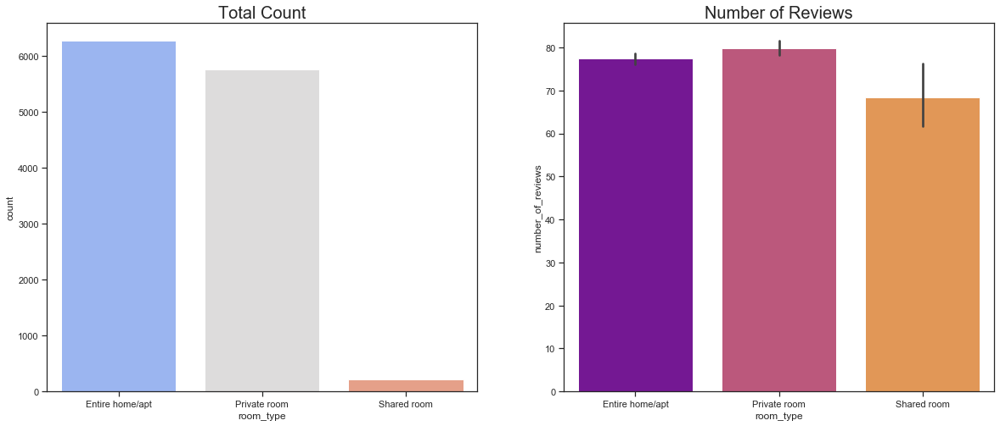

In [43]:
plt.figure(figsize= (20,8))
plt.subplot(1,2,1)
sns.countplot(data= airbnb_rev24, x = 'room_type',palette = 'coolwarm')
plt.title('Total Count',fontsize = 20)
plt.subplot(1,2,2)
sns.barplot(data= airbnb_rev24, x = 'room_type', y = 'number_of_reviews', palette = 'plasma')
plt.title('Number of Reviews',fontsize = 20)

In [44]:
i = px.box(airbnb_rev24, x = 'room_type', y = 'number_of_reviews', color = 'room_type')
i.show()

- REKOMENDASI INVESTASI: PRIVATE ROOM ATAU ENTIRE HOME/APT

# ----- CALCULATED HOST LISTINGS -----

In [45]:
airbnb_rev24['calculated_host_listings_count'].unique()

array([ 2,  1,  4,  3,  6,  5, 13, 28, 11,  8,  7, 15, 19, 10, 26, 12,  9,
       17, 34, 30], dtype=int64)

In [46]:
airbnb_rev24['calculated_host_listings_count'].value_counts()

1     7174
2     2419
3     1107
4      594
5      305
6      181
8       97
7       85
10      52
9       51
12      48
11      38
13      29
28      16
15      13
17      12
30       5
19       4
26       3
34       2
Name: calculated_host_listings_count, dtype: int64

In [47]:
airbnb_rev24['calculated_host_listings_count'].describe()

count    12235.000000
mean         2.064569
std          2.280820
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max         34.000000
Name: calculated_host_listings_count, dtype: float64

In [48]:
# CUT-OFF POINT = 2
print(try_normal(airbnb[(airbnb['calculated_host_listings_count'] <= 2)]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['calculated_host_listings_count'] > 2)]['number_of_reviews']))

print(try_normal(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] <= 2)]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] > 2)]['number_of_reviews']))

print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] <= 2)]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] > 2)]['number_of_reviews'])))

# CUT-OFF POINT = 1
print(try_normal(airbnb[(airbnb['calculated_host_listings_count'] <= 1)]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['calculated_host_listings_count'] > 1)]['number_of_reviews']))

print(try_normal(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] <= 1)]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] > 1)]['number_of_reviews']))

print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] <= 1)]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] > 1)]['number_of_reviews'])))

{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 5686.69128588395}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 1393.7366237521073}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 553.7794735658354}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.575, 10.0: 0.655, 5.0: 0.786, 2.5: 0.917, 1.0: 1.09, 'stat': 173.24487531062914}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 97.46467821668739}, 'Shapiro': 1.401298464324817e-45, 'K^2': 1.8649861423486287e-134}
{'Anderson': {15.0: 0.575, 10.0: 0.655, 5.0: 0.786, 2.5: 0.917, 1.0: 1.09, 'stat': 23.922314851176452}, 'Shapiro': 2.764745158282577e-26, 'K^2': 1.0118523534274165e-29}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 4922.497609557155}, 'Shapiro': 0.0, 'K^2': 0.0}
{

- DISTRIBUSI DATA JUMLAH HOST-LISTING TERHADAP NUMBER OF REVIEWS TIDAK NORMAL

In [49]:
# CUT-OFF POINT = 2
print(levene(airbnb[(airbnb['calculated_host_listings_count'] <= 2)]['number_of_reviews'], 
             airbnb[(airbnb['calculated_host_listings_count'] > 2)]['number_of_reviews']))

print(levene(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] <= 2)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] > 2)]['number_of_reviews']))


# CUT-OFF POINT = 1
print(levene(airbnb[(airbnb['calculated_host_listings_count'] <= 1)]['number_of_reviews'], 
             airbnb[(airbnb['calculated_host_listings_count'] > 1)]['number_of_reviews']))

print(levene(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] <= 1)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] > 1)]['number_of_reviews']))

LeveneResult(statistic=16.67046567119428, pvalue=4.4538602941751525e-05)
LeveneResult(statistic=1.4021737112013244, pvalue=0.23638296663091596)
LeveneResult(statistic=352.3075272826517, pvalue=2.5148627855187984e-78)
LeveneResult(statistic=27.556107717744748, pvalue=1.55157721460357e-07)


- DATA JUMLAH HOST-LISTING TERHADAP NUMBER OF REVIEWS MEMILIKI UNEQUAL VARIANCE
  KECUALI UNTUK JUMLAH HOST-LISTING > 2 PADA AIRBNB POPULAR

In [50]:
# CUT-OFF POINT = 2
print(kruskal(airbnb[(airbnb['calculated_host_listings_count'] <= 2)]['number_of_reviews'], 
             airbnb[(airbnb['calculated_host_listings_count'] > 2)]['number_of_reviews']))

print(kruskal(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] <= 2)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] > 2)]['number_of_reviews']))

# CUT-OFF POINT = 1
print(kruskal(airbnb[(airbnb['calculated_host_listings_count'] <= 1)]['number_of_reviews'], 
             airbnb[(airbnb['calculated_host_listings_count'] > 1)]['number_of_reviews']))

print(kruskal(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] <= 1)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] > 1)]['number_of_reviews']))


print(f_oneway(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] <= 1)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] > 1)]['number_of_reviews']))


KruskalResult(statistic=-334409.75307405705, pvalue=1.0)
KruskalResult(statistic=0.5901930399348126, pvalue=0.44234448108224)
KruskalResult(statistic=-334942.30259941827, pvalue=1.0)
KruskalResult(statistic=27.925709569850476, pvalue=1.2606357719939993e-07)
F_onewayResult(statistic=37.850908544042845, pvalue=7.874719392253036e-10)


In [51]:
from scipy.stats import mannwhitneyu

In [52]:
# MANNWHITNEYU
result = list(mannwhitneyu(airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] <= 1)]['number_of_reviews'], 
                      airbnb_rev24[(airbnb_rev24['calculated_host_listings_count'] > 1)]['number_of_reviews']))
print('U-Statistic:', result[0],'P-Value:', result[1])

U-Statistic: 17137100.5 P-Value: 6.303268334369567e-08


- SECARA KRUSKAL, F-TEST, DAN MANNWHITNEYU, UTK NUMBER OF VIEWS >= 24 (POPULAR), JUMLAH HOST-LISTING CUTOFF 1 MEMILIKI PENGARUH/HUBUNGAN TERHADAP PERBEDAAN NUMBER OF REVIEWS

In [53]:
airbnb_1 = airbnb_rev24.copy()

def mylisting(cols):
    if cols <= 1:
        return '<= 1'
    elif cols > 1:
        return '> 1'

airbnb_1['1']= airbnb_1['calculated_host_listings_count'].apply(mylisting)

In [54]:
pairwise_ttests(data = airbnb_1, dv = 'number_of_reviews', between = '1', parametric = False)

,Contrast,A,B,Paired,Parametric,U-val,Tail,p-unc,hedges
0,1,> 1,<= 1,False,False,19170513.5,two-sided,1.260654e-07,0.113


- SECARA PAIRWISE T-TEST, UTK NUMBER OF VIEWS >= 24 (POPULAR), JUMLAH HOST-LISTING CUTOFF 1 MEMILIKI PENGARUH/HUBUNGAN TERHADAP PERBEDAAN NUMBER OF REVIEWS

In [55]:
airbnb_1[(airbnb_1['calculated_host_listings_count'] == 34)]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,1
32339,25310404,Opal Bedroom,119669058,Melissa,Brooklyn,Bedford-Stuyvesant,40.69314,-73.95710,Private room,60,2,24,2019-06-12,1.76,34,340,> 1
32340,25310497,Jade Bedroom,119669058,Melissa,Brooklyn,Bedford-Stuyvesant,40.69275,-73.95574,Private room,60,2,30,2019-06-10,2.22,34,310,> 1


In [56]:
airbnb_1.groupby('1').max()

,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
1,,,,,,,,,,,,,,
<= 1,34150120,257832461,Staten Island,Woodside,40.90804,-73.71299,Shared room,2990,500,540,2019-07-08,20.94,1,365
> 1,34392081,259630588,Staten Island,Woodside,40.89873,-73.72943,Shared room,2000,999,629,2019-07-08,58.50,34,365


In [57]:
airbnb_1.groupby('1').count()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
1,,,,,,,,,,,,,,,,
<= 1,7174,7173,7174,7169,7174,7174,7174,7174,7174,7174,7174,7174,7174,7174,7174,7174
> 1,5061,5061,5061,5056,5061,5061,5061,5061,5061,5061,5061,5061,5061,5061,5061,5061


In [58]:
airbnb_1.groupby('1').median()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
1,,,,,,,,,,
<= 1,13219955.0,21463633.5,40.722325,-73.95580,120.0,2.0,55.0,2.09,1.0,108.0
> 1,15126483.0,28370925.0,40.715200,-73.94567,80.0,2.0,61.0,2.43,3.0,169.0


In [59]:
airbnb_1.groupby('1').mean()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
1,,,,,,,,,,
<= 1,1.313064e+07,4.964823e+07,40.728195,-73.952496,148.495261,3.998467,75.487733,2.423929,1.000000,138.704767
> 1,1.445799e+07,5.798414e+07,40.724884,-73.937072,109.718830,3.876111,82.421261,2.815519,3.573602,172.951393


- Terdapat perbedaan mean number of reviews diantara kategori jumlah host listing ('>1' > '<=1')
- Median number of reviews <=1 & >1 berbeda signifikan, dengan median >1 lebih besar
- Modus terbesar diraih oleh kategori <=1 (total 7174 frekuensi)
- Jumlah number of reviews terbanyak berdasarkan jumlah host listing diraih oleh individu kategori >1 (629 number of reviews)


Text(0.5, 1.0, 'Number of Reviews')

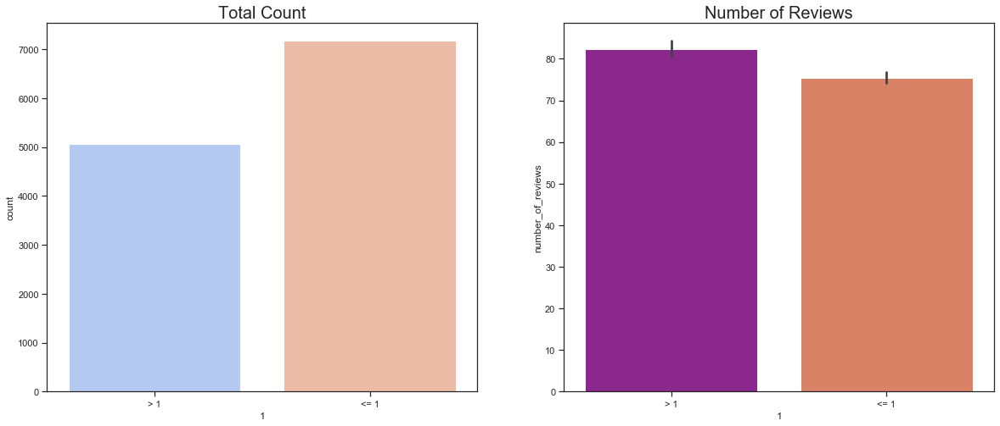

In [60]:
plt.figure(figsize= (20,8))
plt.subplot(1,2,1)
sns.countplot(data= airbnb_1, x = '1',palette = 'coolwarm')
plt.title('Total Count',fontsize = 20)
plt.subplot(1,2,2)
sns.barplot(data= airbnb_1, x = '1', y = 'number_of_reviews', palette = 'plasma')
plt.title('Number of Reviews',fontsize = 20)

In [61]:
i = px.scatter(airbnb_rev24, x = 'calculated_host_listings_count', y = 'number_of_reviews', color = 'room_type')
i.show()

- REKOMENDASI INVESTASI: HOST LISTING > 1, NAMUN APABILA INGIN FOKUS SATU TEMPAT (<= 1) JUGA TIDAK MASALAH

# ----- PRICE -----

In [62]:
airbnb['price'].describe()

count    48895.000000
mean       152.720687
std        240.154170
min          0.000000
25%         69.000000
50%        106.000000
75%        175.000000
max      10000.000000
Name: price, dtype: float64

In [63]:
# CUT-OFF POINT = 175
print(try_normal(airbnb[(airbnb['price'] <= 175)]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['price'] > 175)]['number_of_reviews']))

print(try_normal(airbnb_rev24[(airbnb_rev24['price'] <= 175)]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['price'] > 175)]['number_of_reviews']))

print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['price'] <= 175)]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['price'] > 175)]['number_of_reviews'])))

# CUT-OFF POINT = 1
print(try_normal(airbnb[(airbnb['price'] <= 152.7)]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['price'] > 152.7)]['number_of_reviews']))

print(try_normal(airbnb_rev24[(airbnb_rev24['price'] <= 152.7)]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['price'] > 152.7)]['number_of_reviews']))

print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['price'] <= 152.7)]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['price'] > 152.7)]['number_of_reviews'])))

{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 5160.027171988491}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 1911.2834115602564}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 582.6872048884452}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.575, 10.0: 0.655, 5.0: 0.786, 2.5: 0.917, 1.0: 1.09, 'stat': 138.06423316331438}, 'Shapiro': 0.0, 'K^2': 2.711041629088564e-225}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 93.78995720066996}, 'Shapiro': 2.802596928649634e-45, 'K^2': 4.270638785851608e-121}
{'Anderson': {15.0: 0.575, 10.0: 0.655, 5.0: 0.786, 2.5: 0.917, 1.0: 1.09, 'stat': 27.124983970971698}, 'Shapiro': 2.0344836760702602e-26, 'K^2': 5.064187429801958e-37}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 4779.141610947139}, 'Shapiro':

- DATA PRICE TERHADAP NUMBER OF REVIEWS TIDAK NORMAL

In [64]:
# CUT-OFF POINT = 175
print(levene(airbnb[(airbnb['price'] <= 175)]['number_of_reviews'], 
             airbnb[(airbnb['price'] > 175)]['number_of_reviews']))

print(levene(airbnb_rev24[(airbnb_rev24['price'] <= 175)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['price'] > 175)]['number_of_reviews']))


# CUT-OFF POINT = 152.7
print(levene(airbnb[(airbnb['price'] <= 152.7)]['number_of_reviews'], 
             airbnb[(airbnb['price'] > 152.7)]['number_of_reviews']))

print(levene(airbnb_rev24[(airbnb_rev24['price'] <= 152.7)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['price'] > 152.7)]['number_of_reviews']))

LeveneResult(statistic=164.80554735532584, pvalue=1.1606351578635626e-37)
LeveneResult(statistic=19.293341694315156, pvalue=1.1303907393672363e-05)
LeveneResult(statistic=111.42611433940594, pvalue=5.090739088837881e-26)
LeveneResult(statistic=9.846078326144635, pvalue=0.0017059830047960276)


- DATA PRICE TERHADAP NUMBER OF REVIEWS SECARA KESELURUHAN MEMILIKI UNEQUAL VARIANCE

In [65]:
# CUT-OFF POINT = 2
print(kruskal(airbnb[(airbnb['price'] <= 175)]['number_of_reviews'], 
             airbnb[(airbnb['price'] > 175)]['number_of_reviews']))

print(kruskal(airbnb_rev24[(airbnb_rev24['price'] <= 175)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['price'] > 175)]['number_of_reviews']))


# CUT-OFF POINT = 1
print(kruskal(airbnb[(airbnb['price'] <= 152.7)]['number_of_reviews'], 
             airbnb[(airbnb['price'] > 152.7)]['number_of_reviews']))

print(kruskal(airbnb_rev24[(airbnb_rev24['price'] <= 152.7)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['price'] > 152.7)]['number_of_reviews']))

KruskalResult(statistic=-334942.0522684723, pvalue=1.0)
KruskalResult(statistic=15.07984987613733, pvalue=0.00010305752414555698)
KruskalResult(statistic=-334764.9010519651, pvalue=1.0)
KruskalResult(statistic=5.493498703709099, pvalue=0.019087309566690826)


In [66]:
# MANNWHITNEYU
result = list(mannwhitneyu(airbnb_rev24[(airbnb_rev24['price'] <= 175)]['number_of_reviews'], 
                      airbnb_rev24[(airbnb_rev24['price'] > 175)]['number_of_reviews']))
print('U-Statistic:', result[0],'P-Value:', result[1])

result = list(mannwhitneyu(airbnb_rev24[(airbnb_rev24['price'] <= 152.7)]['number_of_reviews'], 
                      airbnb_rev24[(airbnb_rev24['price'] > 152.7)]['number_of_reviews']))
print('U-Statistic:', result[0],'P-Value:', result[1])

U-Statistic: 11521746.5 P-Value: 5.1529436056897887e-05
U-Statistic: 14076583.5 P-Value: 0.009543729239350924


- SECARA KRUSKAL & MANNWHITNEYU, UTK NUMBER OF VIEWS >= 24 (POPULAR), HARGA MEMILIKI PENGARUH/HUBUNGAN TERHADAP PERBEDAAN NUMBER OF REVIEWS. 
- CUTOFF POINT USD175 MEMILIKI PERBEDAAN LEBIH SIGNIFIKAN DIBANDINGKAN CUTOFF POINT USD152.7

In [67]:
airbnb_1 = airbnb_rev24.copy()

def myprice(cols):
    if cols <= 175:
        return '<= $175'
    elif cols > 175:
        return '> $175'

airbnb_1['175']= airbnb_1['price'].apply(myprice)

In [68]:
pairwise_ttests(data = airbnb_1, dv = 'number_of_reviews', between = '175', parametric = False)

,Contrast,A,B,Paired,Parametric,U-val,Tail,p-unc,hedges
0,175,> $175,<= $175,False,False,11521746.5,two-sided,0.000103,-0.108


- SECARA PAIRWISE T-TEST, UTK NUMBER OF VIEWS >= 24 (POPULAR), HARGA MEMILIKI PENGARUH/HUBUNGAN TERHADAP PERBEDAAN NUMBER OF REVIEWS. 

In [69]:
airbnb_1.groupby('175').mean()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
175,,,,,,,,,,
<= $175,1.404944e+07,5.492634e+07,40.725810,-73.940390,93.384607,3.835505,79.701796,2.679949,2.144484,148.754028
> $175,1.223268e+07,4.593453e+07,40.730798,-73.968523,285.365060,4.387550,73.087952,2.217876,1.751807,168.982731


In [70]:
airbnb_1.groupby('175').median()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
175,,,,,,,,,,
<= $175,14439638,25468442,40.71563,-73.94760,89,2,58,2.31,1,126
> $175,11486034,17130682,40.72843,-73.97751,230,2,55,1.91,1,174


In [71]:
airbnb_1.groupby('175').count()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
175,,,,,,,,,,,,,,,,
<= $175,9745,9745,9745,9736,9745,9745,9745,9745,9745,9745,9745,9745,9745,9745,9745,9745
> $175,2490,2489,2490,2489,2490,2490,2490,2490,2490,2490,2490,2490,2490,2490,2490,2490


In [72]:
airbnb_1.groupby('175').max()

,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
175,,,,,,,,,,,,,,
<= $175,34392081,259630588,Staten Island,Woodside,40.90804,-73.71299,Shared room,175,999,629,2019-07-08,58.50,34,365
> $175,33138268,249495371,Staten Island,Woodside,40.88485,-73.74941,Shared room,2990,198,447,2019-07-08,27.95,30,365


- Terdapat perbedaan mean number of reviews diantara kategori price ('<= USD175' > '> USD175')
- Median number of reviews <= USD175 & > USD175 berbeda, dengan median <=175 lebih besar
- Modus terbesar diraih oleh kategori <=175 (total 9745 frekuensi)
- Jumlah number of reviews terbanyak berdasarkan jumlah host listing diraih oleh individu kategori <=175 (629 number of reviews)

Text(0.5, 1.0, 'Number of Reviews')

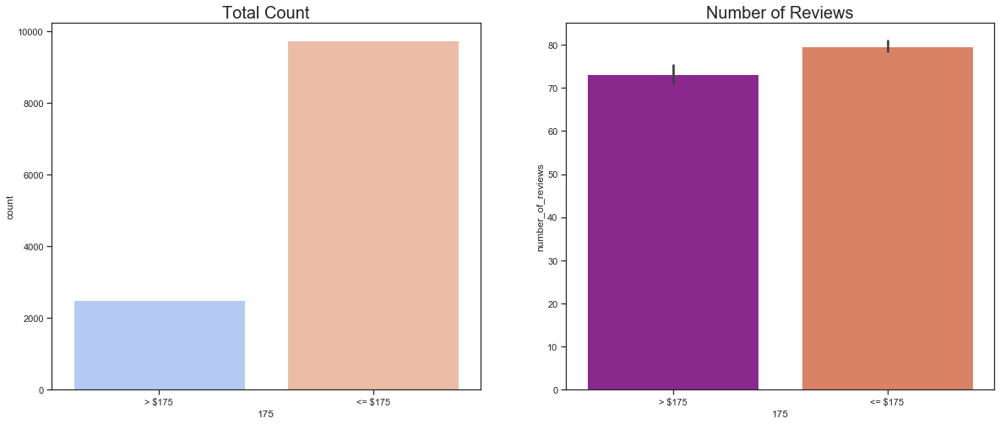

In [73]:
plt.figure(figsize= (20,8))
plt.subplot(1,2,1)
sns.countplot(data= airbnb_1, x = '175',palette = 'coolwarm')
plt.title('Total Count',fontsize = 20)
plt.subplot(1,2,2)
sns.barplot(data= airbnb_1, x = '175', y = 'number_of_reviews', palette = 'plasma')
plt.title('Number of Reviews',fontsize = 20)

In [74]:
i = px.scatter(airbnb_rev24, x = 'price', y = 'number_of_reviews', color = 'room_type')
i.show()

In [125]:
airbnb_rev24.corr()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,name_total_words
id,1.000000,0.666325,-0.013488,0.161033,-0.086493,-0.088340,-0.365452,0.500694,0.051243,-0.142984,0.203594
host_id,0.666325,1.000000,0.002286,0.192716,-0.063739,-0.055720,-0.216602,0.402636,0.081118,-0.004276,0.090565
latitude,-0.013488,0.002286,1.000000,0.087740,0.028946,0.003774,0.006686,-0.001674,-0.016322,-0.055401,0.003297
longitude,0.161033,0.192716,0.087740,1.000000,-0.233956,-0.040804,0.000780,0.152850,0.092261,0.083213,-0.040155
price,-0.086493,-0.063739,0.028946,-0.233956,1.000000,0.037483,-0.047689,-0.106044,-0.096984,0.082417,0.056277
minimum_nights,-0.088340,-0.055720,0.003774,-0.040804,0.037483,1.000000,-0.042730,-0.105127,0.022597,0.016046,-0.016775
number_of_reviews,-0.365452,-0.216602,0.006686,0.000780,-0.047689,-0.042730,1.000000,0.421268,-0.003526,0.124699,-0.047212
reviews_per_month,0.500694,0.402636,-0.001674,0.152850,-0.106044,-0.105127,0.421268,1.000000,0.050331,-0.016343,0.131477
calculated_host_listings_count,0.051243,0.081118,-0.016322,0.092261,-0.096984,0.022597,-0.003526,0.050331,1.000000,0.131754,-0.006138
availability_365,-0.142984,-0.004276,-0.055401,0.083213,0.082417,0.016046,0.124699,-0.016343,0.131754,1.000000,-0.070045


- REKOMENDASI INVESTASI: HARGA <= $175

# ----- MINIMUM NIGHTS -----

In [75]:
airbnb['minimum_nights'].describe()

count    48895.000000
mean         7.029962
std         20.510550
min          1.000000
25%          1.000000
50%          3.000000
75%          5.000000
max       1250.000000
Name: minimum_nights, dtype: float64

In [76]:
# CUT-OFF POINT = 5
print(try_normal(airbnb[(airbnb['minimum_nights'] <= 5)]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['minimum_nights'] > 5)]['number_of_reviews']))

print(try_normal(airbnb_rev24[(airbnb_rev24['minimum_nights'] <= 5)]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['minimum_nights'] > 5)]['number_of_reviews']))

print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['minimum_nights'] <= 5)]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['minimum_nights'] > 5)]['number_of_reviews'])))

# CUT-OFF POINT = 4
print(try_normal(airbnb[(airbnb['minimum_nights'] <= 4)]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['minimum_nights'] > 4)]['number_of_reviews']))

print(try_normal(airbnb_rev24[(airbnb_rev24['minimum_nights'] <= 4)]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['minimum_nights'] > 4)]['number_of_reviews']))

print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['minimum_nights'] <= 4)]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['minimum_nights'] > 4)]['number_of_reviews'])))

{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 5089.105357427674}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 1819.6703426048807}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 637.9304930135768}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.574, 10.0: 0.653, 5.0: 0.784, 2.5: 0.914, 1.0: 1.088, 'stat': 74.24836598166485}, 'Shapiro': 1.9682768550663563e-38, 'K^2': 4.00428293543196e-155}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 100.24814586793218}, 'Shapiro': 0.0, 'K^2': 4.5640425263403855e-142}
{'Anderson': {15.0: 0.574, 10.0: 0.653, 5.0: 0.784, 2.5: 0.914, 1.0: 1.088, 'stat': 19.13379163950458}, 'Shapiro': 1.6479599659589851e-21, 'K^2': 3.513105565782375e-22}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 4615.965884623787}, 'Shapiro

- DISTRIBUSI DATA MINIMUM NIGHTS TERHADAP NUMBER OF REVIEWS SECARA KESELURUHAN TIDAK NORMAL

In [77]:
print(levene(airbnb_rev24[(airbnb_rev24['minimum_nights'] <= 4)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['minimum_nights'] > 4)]['number_of_reviews']))

print(levene(airbnb_rev24[(airbnb_rev24['minimum_nights'] <= 5)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['minimum_nights'] > 5)]['number_of_reviews']))

LeveneResult(statistic=134.8744839381227, pvalue=5.114947332090873e-31)
LeveneResult(statistic=103.53592106926988, pvalue=3.192918032060809e-24)


- DATA MINIMUM NIGHTS TERHADAP NUMBER OF REVIEWS SECARA KESELURUHAN MEMILIKI UNEQUAL VARIANCE

In [78]:
# CUT-OFF POINT = 5
print(kruskal(airbnb[(airbnb['minimum_nights'] <= 4)]['number_of_reviews'], 
             airbnb[(airbnb['minimum_nights'] > 4)]['number_of_reviews']))

print(kruskal(airbnb_rev24[(airbnb_rev24['minimum_nights'] <= 4)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['minimum_nights'] > 4)]['number_of_reviews']))

# CUT-OFF POINT = 4
print(kruskal(airbnb[(airbnb['minimum_nights'] <= 5)]['number_of_reviews'], 
             airbnb[(airbnb['minimum_nights'] > 5)]['number_of_reviews']))

print(kruskal(airbnb_rev24[(airbnb_rev24['minimum_nights'] <= 5)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['minimum_nights'] > 5)]['number_of_reviews']))

KruskalResult(statistic=-337761.7543922425, pvalue=1.0)
KruskalResult(statistic=191.02306859145273, pvalue=1.901167340633677e-43)
KruskalResult(statistic=-337903.3997287237, pvalue=1.0)
KruskalResult(statistic=176.29987346559943, pvalue=3.1142506580601354e-40)


In [79]:
# MANNWHITNEY U
result = list(mannwhitneyu(airbnb_rev24[(airbnb_rev24['minimum_nights'] <= 4)]['number_of_reviews'], 
                      airbnb_rev24[(airbnb_rev24['minimum_nights'] > 4)]['number_of_reviews']))
print('U-Statistic:', result[0],'P-Value:', result[1])

result = list(mannwhitneyu(airbnb_rev24[(airbnb_rev24['minimum_nights'] <= 5)]['number_of_reviews'], 
                      airbnb_rev24[(airbnb_rev24['minimum_nights'] > 5)]['number_of_reviews']))
print('U-Statistic:', result[0],'P-Value:', result[1])

U-Statistic: 6703733.0 P-Value: 9.506337515802955e-44
U-Statistic: 4299118.0 P-Value: 1.5572214655275817e-40


- UTK NUMBER OF VIEWS >= 24 (POPULAR), MINIMUM NIGHTS MEMILIKI PENGARUH/HUBUNGAN TERHADAP PERBEDAAN NUMBER OF REVIEWS. 
- CUTOFF POINT 4 NIGHTS MEMILIKI PERBEDAAN LEBIH SIGNIFIKAN DIBANDINGKAN CUTOFF POINT 5 NIGHTS

In [80]:
airbnb_1 = airbnb_rev24.copy()

def mynights(cols):
    if cols <= 4:
        return '<= 4'
    elif cols > 4:
        return '> 4'

airbnb_1['4']= airbnb_1['minimum_nights'].apply(mynights)

In [81]:
pairwise_ttests(data = airbnb_1, dv = 'number_of_reviews', between = '4', parametric = False)

,Contrast,A,B,Paired,Parametric,U-val,Tail,p-unc,hedges
0,4,<= 4,> 4,False,False,10348391.0,two-sided,1.901268e-43,0.347


- SECARA PAIRWISE T-TEST, UTK NUMBER OF VIEWS >= 24 (POPULAR), MINIMUM NIGHTS CUTOFF 4 MALAM MEMILIKI PENGARUH/HUBUNGAN TERHADAP PERBEDAAN NUMBER OF REVIEWS

In [82]:
airbnb_1.groupby('4').mean()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
4,,,,,,,,,,
<= 4,1.435177e+07,5.651939e+07,40.726462,-73.944606,129.253316,2.035368,81.136300,2.752517,2.069984,151.906876
> 4,9.225367e+06,3.040927e+07,40.729233,-73.956124,153.678304,16.623441,59.927057,1.481671,2.028678,159.259975


In [83]:
airbnb_1.groupby('4').median()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
4,,,,,,,,,,
<= 4,14839995.0,26535250.0,40.71952,-73.950910,100.0,2.0,60.0,2.40,1.0,133.0
> 4,6480587.5,9522524.0,40.72406,-73.956485,115.5,7.0,46.0,1.17,1.0,151.0


In [84]:
airbnb_1.groupby('4').max()

,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
4,,,,,,,,,,,,,,
<= 4,34392081,259630588,Staten Island,Woodside,40.90804,-73.71299,Shared room,2990,4,629,2019-07-08,58.50,34,365
> 4,30441504,226572566,Staten Island,Woodside,40.89603,-73.73087,Shared room,2000,999,467,2019-07-08,7.26,26,365


In [85]:
airbnb_1.groupby('4').count()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
4,,,,,,,,,,,,,,,,
<= 4,10631,10630,10631,10622,10631,10631,10631,10631,10631,10631,10631,10631,10631,10631,10631,10631
> 4,1604,1604,1604,1603,1604,1604,1604,1604,1604,1604,1604,1604,1604,1604,1604,1604


- Terdapat perbedaan mean number of reviews diantara kategori minimum nights ('<=4' > '>4')
- Median number of reviews <=4 & >4 berbeda signifikan, dengan median <=4 lebih besar
- Modus terbesar diraih oleh kategori <=4 (total 10631 frekuensi)
- Jumlah number of reviews terbanyak berdasarkan minimum nights diraih oleh individu kategori <=4 (629 number of reviews)


Text(0.5, 1.0, 'Number of Reviews')

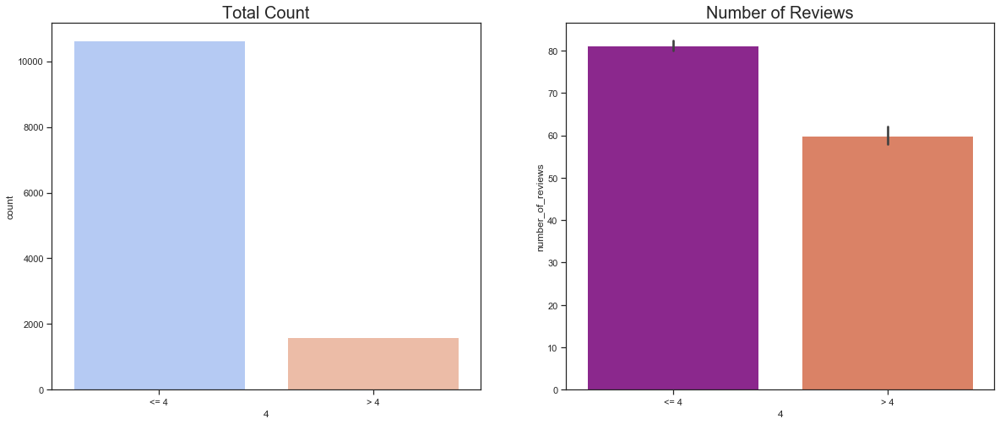

In [86]:
plt.figure(figsize= (20,8))
plt.subplot(1,2,1)
sns.countplot(data= airbnb_1, x = '4',palette = 'coolwarm')
plt.title('Total Count',fontsize = 20)
plt.subplot(1,2,2)
sns.barplot(data= airbnb_1, x = '4', y = 'number_of_reviews', palette = 'plasma')
plt.title('Number of Reviews',fontsize = 20)

In [87]:
i = px.scatter(airbnb_rev24, x = 'minimum_nights', y = 'number_of_reviews', color = 'room_type')
i.show()

- REKOMENDASI INVESTASI: MINIMUM NIGHTS <= 4 MALAM

# ----- TOTAL WORDS IN NAME -----

In [88]:
airbnb['name'].unique()

array(['Clean & quiet apt home by the park', 'Skylit Midtown Castle',
       'THE VILLAGE OF HARLEM....NEW YORK !', ...,
       'Sunny Studio at Historical Neighborhood',
       '43rd St. Time Square-cozy single bed',
       "Trendy duplex in the very heart of Hell's Kitchen"], dtype=object)

In [89]:
def counter1(cols):
    return len(str(cols))

airbnb['name_total_words'] = airbnb['name'].apply(counter1)
airbnb['name_total_words']

airbnb_rev24['name_total_words'] = airbnb_rev24['name'].apply(counter1)
airbnb_rev24['name_total_words']

1        21
3        31
5        41
6        15
7        32
         ..
43735    50
43791    50
44281    50
44435    50
44764    49
Name: name_total_words, Length: 12235, dtype: int64

In [90]:
airbnb['name_total_words'].describe()

count    48895.000000
mean        36.900051
std         10.507731
min          1.000000
25%         31.000000
50%         36.000000
75%         46.000000
max        179.000000
Name: name_total_words, dtype: float64

In [91]:
# CUT-OFF POINT = 36
print(try_normal(airbnb[(airbnb['name_total_words'] <= 36)]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['name_total_words'] > 36)]['number_of_reviews']))

print(try_normal(airbnb_rev24[(airbnb_rev24['name_total_words'] <= 36)]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['name_total_words'] > 36)]['number_of_reviews']))

print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['name_total_words'] <= 36)]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['name_total_words'] > 36)]['number_of_reviews'])))

# CUT-OFF POINT = 46
print(try_normal(airbnb[(airbnb['name_total_words'] <= 46)]['number_of_reviews']))
print(try_normal(airbnb[(airbnb['name_total_words'] > 46)]['number_of_reviews']))

print(try_normal(airbnb_rev24[(airbnb_rev24['name_total_words'] <= 46)]['number_of_reviews']))
print(try_normal(airbnb_rev24[(airbnb_rev24['name_total_words'] > 46)]['number_of_reviews']))

print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['name_total_words'] <= 46)]['number_of_reviews'])))
print(try_normal(np.log(airbnb_rev24[(airbnb_rev24['name_total_words'] > 46)]['number_of_reviews'])))

{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 3658.4392577410363}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 3342.4621724393946}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.917, 1.0: 1.091, 'stat': 351.8319684647013}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.786, 2.5: 0.917, 1.0: 1.091, 'stat': 344.0070538512782}, 'Shapiro': 0.0, 'K^2': 0.0}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.917, 1.0: 1.091, 'stat': 62.39489661819425}, 'Shapiro': 5.434738791060026e-38, 'K^2': 3.3099377700275876e-107}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.786, 2.5: 0.917, 1.0: 1.091, 'stat': 55.8529008065434}, 'Shapiro': 1.044094257510918e-37, 'K^2': 9.747721239388187e-67}
{'Anderson': {15.0: 0.576, 10.0: 0.656, 5.0: 0.787, 2.5: 0.918, 1.0: 1.092, 'stat': 5510.374752016112}, 'Shapiro': 0.0, 'K^2': 0.0}
{

- DISTRIBUSI DATA NAME TOTAL WORDS TERHADAP NUMBER OF REVIEWS TIDAK NORMAL

In [92]:
# CUT-OFF POINT = 36
print(levene(airbnb_rev24[(airbnb_rev24['name_total_words'] <= 36)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['name_total_words'] > 36)]['number_of_reviews']))

# CUT-OFF POINT = 46
print(levene(airbnb_rev24[(airbnb_rev24['name_total_words'] <= 46)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['name_total_words'] > 46)]['number_of_reviews']))

LeveneResult(statistic=146.62373585142322, pvalue=1.4752387466783793e-33)
LeveneResult(statistic=41.76790824775285, pvalue=1.0667813665746163e-10)


- DATA NAME TOTAL WORDS TERHADAP NUMBER OF REVIEWS DGN CUTOFF 36 & 46 KATA MEMILIKI UNEQUAL VARIANCE 

In [93]:
# CUT-OFF POINT = 36
print(kruskal(airbnb_rev24[(airbnb_rev24['name_total_words'] <= 36)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['name_total_words'] > 36)]['number_of_reviews']))

# CUT-OFF POINT = 46
print(kruskal(airbnb_rev24[(airbnb_rev24['name_total_words'] <= 46)]['number_of_reviews'], 
             airbnb_rev24[(airbnb_rev24['name_total_words'] > 46)]['number_of_reviews']))


KruskalResult(statistic=94.74541258655438, pvalue=2.1651466220879245e-22)
KruskalResult(statistic=29.41506449871406, pvalue=5.842174014577101e-08)


In [94]:
# MANNWHITNEY U
result = list(mannwhitneyu(airbnb_rev24[(airbnb_rev24['name_total_words'] <= 36)]['number_of_reviews'], 
                      airbnb_rev24[(airbnb_rev24['name_total_words'] > 36)]['number_of_reviews']))
print('U-Statistic:', result[0],'P-Value:', result[1])

result = list(mannwhitneyu(airbnb_rev24[(airbnb_rev24['name_total_words'] <= 46)]['number_of_reviews'], 
                      airbnb_rev24[(airbnb_rev24['name_total_words'] > 46)]['number_of_reviews']))
print('U-Statistic:', result[0],'P-Value:', result[1])

U-Statistic: 16784961.5 P-Value: 1.0826005835960665e-22
U-Statistic: 13158539.0 P-Value: 2.9211352589529544e-08


- SECARA KRUSKAL & MANNWHITNEYU, UTK NUMBER OF VIEWS >= 24 (POPULAR), TOTAL KATA PADA NAMA TEMPAT MEMILIKI PENGARUH/HUBUNGAN TERHADAP PERBEDAAN NUMBER OF REVIEWS. 
- CUTOFF POINT 36 KATA MEMILIKI PERBEDAAN LEBIH SIGNIFIKAN DIBANDINGKAN CUTOFF POINT 46 KATA

In [95]:
airbnb_1 = airbnb_rev24.copy()

def mytotalwords(cols):
    if cols <= 36:
        return '<= 36'
    elif cols > 36:
        return '> 36'

airbnb_1['36']= airbnb_1['name_total_words'].apply(mytotalwords)

In [96]:
pairwise_ttests(data = airbnb_1, dv = 'number_of_reviews', between = '36', parametric = False)

,Contrast,A,B,Paired,Parametric,U-val,Tail,p-unc,hedges
0,36,<= 36,> 36,False,False,20584788.5,two-sided,2.165201e-22,0.221


- SECARA PAIRWISE T-TEST, UTK NUMBER OF VIEWS >= 24 (POPULAR), TOTAL KATA PADA NAMA TEMPAT MEMILIKI PENGARUH/HUBUNGAN TERHADAP PERBEDAAN NUMBER OF REVIEWS.

In [97]:
airbnb_1.groupby('36').mean()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,name_total_words
36,,,,,,,,,,,
<= 36,1.056456e+07,4.126775e+07,40.726358,-73.947275,129.984094,4.469606,84.848976,2.243027,2.037638,163.462205,28.799370
> 36,1.704098e+07,6.585963e+07,40.727330,-73.944865,135.122005,3.384877,71.349533,2.955886,2.093628,141.442651,45.664571


In [98]:
airbnb_1.groupby('36').median()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,name_total_words
36,,,,,,,,,,,
<= 36,8422253,16677326,40.71972,-73.95198,100,2,61,1.84,1,164,31
> 36,18253324,38675275,40.72056,-73.95170,100,2,54,2.59,1,110,47


In [99]:
airbnb_1.groupby('36').max()

,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,name_total_words
36,,,,,,,,,,,,,,,
<= 36,33636410,250896604,Staten Island,Woodside,40.90804,-73.72435,Shared room,2300,999,629,2019-07-08,20.94,34,365,36
> 36,34392081,259630588,Staten Island,Woodside,40.90329,-73.71299,Shared room,2990,200,540,2019-07-08,58.50,30,365,98


In [100]:
airbnb_1.groupby('36').count()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,name_total_words
36,,,,,,,,,,,,,,,,,
<= 36,6350,6349,6350,6345,6350,6350,6350,6350,6350,6350,6350,6350,6350,6350,6350,6350,6350
> 36,5885,5885,5885,5880,5885,5885,5885,5885,5885,5885,5885,5885,5885,5885,5885,5885,5885


- Terdapat perbedaan mean number of reviews diantara kategori name total words ('<=36' > '>36')
- Median number of reviews <=36 & >36 berbeda signifikan, dengan median <=36 lebih besar
- Modus terbesar diraih oleh kategori <=36 (total 6350 frekuensi)
- Jumlah number of reviews terbanyak berdasarkan minimum nights diraih oleh individu kategori <=36 (629 number of reviews)

Text(0.5, 1.0, 'Number of Reviews')

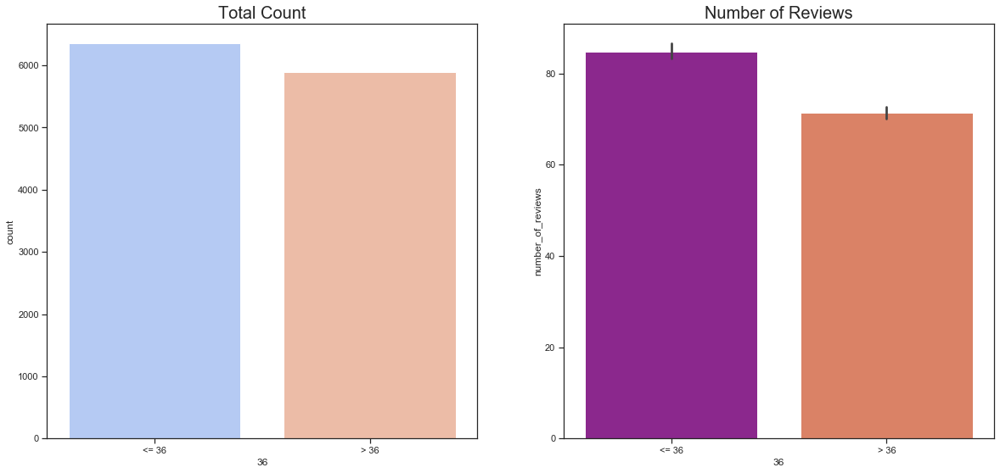

In [101]:
plt.figure(figsize= (20,9))
plt.subplot(1,2,1)
sns.countplot(data= airbnb_1, x = '36',palette = 'coolwarm')
plt.title('Total Count',fontsize = 20)
plt.subplot(1,2,2)
sns.barplot(data= airbnb_1, x = '36', y = 'number_of_reviews', palette = 'plasma')
plt.title('Number of Reviews',fontsize = 20)

In [102]:
i = px.scatter(airbnb_rev24, x = 'name_total_words', y = 'number_of_reviews', color = 'room_type')
i.show()

- REKOMENDASI INVESTASI: NAME TOTAL WORDS <= 36 KATA

# ----- NEIGHBOURHOOD -----

In [103]:
airbnb_rev24['neighbourhood'].unique()

array(['Midtown', 'Clinton Hill', 'Murray Hill', 'Bedford-Stuyvesant',
       "Hell's Kitchen", 'Upper West Side', 'Chinatown', 'South Slope',
       'West Village', 'Williamsburg', 'Fort Greene', 'Chelsea',
       'Crown Heights', 'Park Slope', 'Inwood', 'East Village', 'Harlem',
       'Greenpoint', 'Bushwick', 'Lower East Side', 'Long Island City',
       'Upper East Side', 'Prospect Heights', 'East Harlem',
       'Washington Heights', 'Woodside', 'Brooklyn Heights',
       'Carroll Gardens', 'Kips Bay', 'Sunnyside', 'Gowanus',
       'St. George', 'Highbridge', 'Financial District',
       'Morningside Heights', 'Jamaica', 'Middle Village', 'NoHo',
       'Cobble Hill', 'Flatiron District', 'SoHo', 'East Flatbush',
       'Tompkinsville', 'Astoria', 'Kensington', 'Eastchester',
       'Little Italy', 'Two Bridges', 'Queens Village', 'Forest Hills',
       'Boerum Hill', 'Nolita', 'Windsor Terrace', 'Woodlawn',
       'University Heights', 'Gramercy', 'Allerton', 'East New York',
 

In [104]:
mylist = airbnb_rev24['neighbourhood'].unique()

In [105]:
len(mylist)

202

In [106]:
px.histogram(airbnb_rev24, x = 'neighbourhood', color = 'neighbourhood_group')

In [107]:
px.scatter(airbnb_rev24, x = 'neighbourhood', y = 'number_of_reviews', color = 'neighbourhood_group')

In [108]:
pd.options.display.max_rows = 210
airbnb_rev24.groupby('neighbourhood')[['number_of_reviews']].median()

,number_of_reviews
neighbourhood,
Allerton,41.0
Arrochar,30.0
Arverne,52.0
Astoria,55.5
Bath Beach,38.5
Battery Park City,52.5
Bay Ridge,41.0
Bay Terrace,115.5
Baychester,137.5


In [109]:
airbnb_rev24.groupby('neighbourhood')[['number_of_reviews']].median().max()

number_of_reviews    201.5
dtype: float64

In [110]:
airbnb_rev24.groupby('neighbourhood')[['number_of_reviews']].mean()

,number_of_reviews
neighbourhood,
Allerton,77.863636
Arrochar,34.400000
Arverne,61.062500
Astoria,79.737374
Bath Beach,38.500000
Battery Park City,72.000000
Bay Ridge,58.243243
Bay Terrace,115.500000
Baychester,137.500000


In [111]:
airbnb_rev24.groupby('neighbourhood')[['number_of_reviews']].mean().max()

number_of_reviews    201.5
dtype: float64

In [112]:
airbnb_rev24.groupby('neighbourhood')[['number_of_reviews']].max()

,number_of_reviews
neighbourhood,
Allerton,271
Arrochar,52
Arverne,201
Astoria,441
Bath Beach,51
Battery Park City,205
Bay Ridge,213
Bay Terrace,146
Baychester,206


In [113]:
airbnb_rev24.groupby('neighbourhood')[['number_of_reviews']].max().max()

number_of_reviews    629
dtype: int64

In [114]:
airbnb_rev24.groupby('neighbourhood')[['number_of_reviews']].count()

,number_of_reviews
neighbourhood,
Allerton,22
Arrochar,5
Arverne,32
Astoria,198
Bath Beach,8
Battery Park City,6
Bay Ridge,37
Bay Terrace,2
Baychester,2


In [115]:
airbnb_rev24.groupby('neighbourhood')[['number_of_reviews']].count().max()

number_of_reviews    1154
dtype: int64

- Mean number of reviews terbesar dimiliki oleh daerah Mount Eden (201.5 reviews) & East Elmhurst (153 reviews)
- Median number of reviews terbesar dimiliki oleh daerah Mount Eden (201.5 reviews) & DUMBO (146 reviews)
- Modus terbanyak dimiliki oleh daerah Bedford-Stuyvesant (1154 frekuensi), Williamsburg (869 frekuensi) & Harlem (825 frekuensi)
- Number of reviews terbanyak dimiliki oleh daerah Jamaica (629 reviews) & Harlem (607 reviews)

In [116]:
airbnb[airbnb['neighbourhood'] == 'Mount Eden']
## Bronx

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,name_total_words
1965,858695,Very Large Private Room on quiet st,4494343,Douglas,Bronx,Mount Eden,40.84058,-73.91382,Private room,30,2,291,2019-06-20,3.69,1,208,35
2999,1747833,Affordable Clean Private Room NYC,9197101,Alex Nova York,Bronx,Mount Eden,40.84367,-73.91718,Private room,43,2,11,2014-09-28,0.16,1,338,35
23218,18795447,Large Private Room in Heart of Diversity.,89071431,Ikello,Bronx,Mount Eden,40.84473,-73.91175,Private room,55,2,112,2019-06-30,4.65,1,271,41
31203,24231655,Humble Abode in the Bronx,37417547,Raquel,Bronx,Mount Eden,40.84197,-73.91292,Private room,25,2,2,2018-05-19,0.14,1,0,25
31717,24732974,1 bedroom (entire) apartment very spacious,186318389,Joanna,Bronx,Mount Eden,40.84059,-73.92156,Entire home/apt,150,1,4,2018-05-17,0.28,1,0,42
36436,28966945,Lugar acogedor y confortable,153809989,Sandy,Bronx,Mount Eden,40.84084,-73.92178,Private room,48,2,0,NaN,NaN,1,0,28


In [117]:
airbnb[airbnb['neighbourhood'] == 'DUMBO']
## Brooklyn

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,name_total_words
163,40039,Luxurious Condo in DUBMO with View,171851,Henry,Brooklyn,DUMBO,40.70207,-73.98571,Private room,250,3,14,2011-04-25,0.13,1,189,34
626,236788,"HUGE, modern 2-LEVEL Brooklyn apt",4166168,Nick And Noémie,Brooklyn,DUMBO,40.70257,-73.98470,Entire home/apt,350,5,40,2019-04-14,0.50,1,67,33
2075,932277,Fabulous Industrial Dumbo Loft,2902266,Kate,Brooklyn,DUMBO,40.70434,-73.98989,Private room,125,20,35,2015-01-05,0.45,1,311,30
2091,944840,Dumbo Loft With A Beautiful View,5110818,Kevin,Brooklyn,DUMBO,40.70447,-73.98754,Entire home/apt,134,14,14,2019-01-29,0.18,1,0,32
2102,956412,Charming Bright 2BR apt- sleeps 6,588270,Dikla,Brooklyn,DUMBO,40.70424,-73.98597,Entire home/apt,189,2,236,2019-06-21,3.08,2,279,33
3164,1886294,quitissential brooklyn loft,9813350,Jeremy,Brooklyn,DUMBO,40.70289,-73.98583,Entire home/apt,150,9,0,NaN,NaN,1,0,27
5599,4070025,Luxury Flat with Outdoor and Study Room,21110000,Shahram,Brooklyn,DUMBO,40.70452,-73.98583,Entire home/apt,250,2,150,2019-07-05,2.57,1,309,39
7260,5320983,Beautiful bright renovated 2BR w Balcony-sleep...,588270,Dikla,Brooklyn,DUMBO,40.70430,-73.98667,Entire home/apt,189,2,177,2019-06-09,3.33,2,235,50
7374,5445314,Beautiful Artist loft,21838149,Marcia,Brooklyn,DUMBO,40.70299,-73.98624,Private room,160,1,54,2019-06-20,1.03,1,10,21
8356,6424227,Bright and Sunny Apartment DUMBO,6969910,Ben,Brooklyn,DUMBO,40.70372,-73.98990,Entire home/apt,150,7,0,NaN,NaN,1,0,32


In [118]:
airbnb[airbnb['neighbourhood'] == 'East Elmhurst']
## Queens

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,name_total_words
1162,495249,10min Walk & 15mins to Tourist Spot,2446219,Biren,Queens,East Elmhurst,40.75541,-73.89239,Private room,85,1,219,2019-06-14,2.63,2,305,35
1519,689329,Cozy 15 mins Manhattan& 10 Mins LGA,2446219,Biren,Queens,East Elmhurst,40.75772,-73.89530,Private room,62,1,296,2019-06-29,3.92,2,234,35
2120,973535,"Garden Apt, 5 mins from LaGuardia",3179866,Gonzalo And Nora,Queens,East Elmhurst,40.76356,-73.88850,Entire home/apt,99,3,158,2019-07-02,2.08,2,322,33
5314,3836199,"2 bedroom with yard, 4 mins to LGA",19758179,Telmo,Queens,East Elmhurst,40.76287,-73.88367,Entire home/apt,120,3,102,2019-06-04,1.73,1,300,34
6226,4550041,Bright! LARGE 2 BEDS near Manhattan,23591164,Angela,Queens,East Elmhurst,40.76539,-73.87636,Private room,65,1,356,2019-06-23,6.31,4,341,35
6228,4550557,Bright LARGE 2 BEDS! near Manhattan,23591164,Angela,Queens,East Elmhurst,40.76680,-73.87759,Private room,65,1,426,2019-06-17,7.53,4,312,35
6291,4596378,Nice and cozy near Laguardia,23824219,Joshua,Queens,East Elmhurst,40.75943,-73.89553,Private room,44,3,46,2019-03-17,0.83,1,88,28
6305,4606675,Private Room 2 Beds New York City!,23591164,Angela,Queens,East Elmhurst,40.76610,-73.87739,Private room,65,1,21,2017-07-27,0.38,4,0,34
6684,4808505,"Cozy, CLEAN & SAFE room",24765924,Cesar,Queens,East Elmhurst,40.76313,-73.88368,Private room,50,1,55,2019-07-07,1.21,1,332,23
6936,4968798,Room in Jackson Heights (Queens),23345098,Jorge,Queens,East Elmhurst,40.75703,-73.87667,Private room,45,7,30,2019-04-14,0.56,1,115,32


In [119]:
airbnb[airbnb['neighbourhood'] == 'Jamaica']
## Queens

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,name_total_words
196,51850,( F) Excellent/Pvt Rm,27848,Jullett,Queens,Jamaica,40.67252,-73.76597,Private room,55,2,52,2019-05-20,0.49,2,365,21
1103,467634,yahmanscrashpads,2321321,Lloyd,Queens,Jamaica,40.67747,-73.76493,Shared room,39,1,454,2019-06-18,5.27,1,353,16
1500,676295,(B) BARGAIN SPACE,27848,Jullett,Queens,Jamaica,40.67166,-73.76566,Private room,58,2,56,2019-07-01,0.67,2,365,18
2343,1137999,Private room in a townhouse in NYC,6242426,H. Ann,Queens,Jamaica,40.69965,-73.79286,Private room,133,1,0,NaN,NaN,1,281,34
3773,2269104,Modern Style private room in queens,8568891,Sufia,Queens,Jamaica,40.70950,-73.78828,Private room,65,2,13,2018-07-14,0.22,1,362,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48397,36236515,TRANQUIL HAVEN -8MINS TO JFK/LIRR/AIRTRAIN#3.,178272943,Sharon,Queens,Jamaica,40.67189,-73.78008,Private room,50,1,0,NaN,NaN,4,70,45
48555,36315143,TRANQUIL HAVEN -8MINS TO JFK/LIRR/AIRTRAIN.,178272943,Sharon,Queens,Jamaica,40.67100,-73.77911,Entire home/apt,250,1,0,NaN,NaN,4,69,43
48593,36322148,Welcome Palace 2 !!!,182954454,Thaddeus,Queens,Jamaica,40.67105,-73.77308,Private room,75,2,0,NaN,NaN,2,88,20
48594,36323065,Lovely Home Away,273177557,Veronica,Queens,Jamaica,40.66806,-73.77658,Private room,200,1,0,NaN,NaN,1,168,16


In [120]:
airbnb[airbnb['neighbourhood'] == 'Bedford-Stuyvesant']
## Brooklyn

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,name_total_words
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0,15
24,8490,"MAISON DES SIRENES1,bohemian apartment",25183,Nathalie,Brooklyn,Bedford-Stuyvesant,40.68371,-73.94028,Entire home/apt,120,2,88,2019-06-19,0.73,2,233,38
34,10452,Large B&B Style rooms,35935,Angela,Brooklyn,Bedford-Stuyvesant,40.68310,-73.95473,Private room,70,1,74,2019-05-12,0.66,2,269,21
36,11452,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,40.68876,-73.94312,Private room,35,60,0,NaN,NaN,1,365,27
47,12940,Charming Brownstone 3 - Near PRATT,50148,Adreinne,Brooklyn,Bedford-Stuyvesant,40.68111,-73.95591,Entire home/apt,110,7,61,2019-05-25,0.52,1,265,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48836,36451362,Cozy Queen bed in Quiet Bedstuy!,154095549,Wa,Brooklyn,Bedford-Stuyvesant,40.69195,-73.94225,Private room,47,2,0,NaN,NaN,2,48,32
48843,36453642,"☆ HUGE, SUNLIT Room - 3 min walk from Train !",53966115,Nora,Brooklyn,Bedford-Stuyvesant,40.69635,-73.93743,Private room,45,29,0,NaN,NaN,2,341,46
48856,36457700,"Large 3 bed, 2 bath , garden , bbq , all you need",66993395,Thomas,Brooklyn,Bedford-Stuyvesant,40.68886,-73.92879,Entire home/apt,345,4,0,NaN,NaN,3,354,49
48869,36474023,"Cozy, Sunny Brooklyn Escape",1550580,Julia,Brooklyn,Bedford-Stuyvesant,40.68759,-73.95705,Private room,45,4,0,NaN,NaN,1,7,27


In [121]:
airbnb[airbnb['neighbourhood'] == 'Williamsburg']
## Brooklyn

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,name_total_words
15,6848,Only 2 stops to Manhattan studio,15991,Allen & Irina,Brooklyn,Williamsburg,40.70837,-73.95352,Entire home/apt,140,2,148,2019-06-29,1.20,1,46,32
20,7801,Sweet and Spacious Brooklyn Loft,21207,Chaya,Brooklyn,Williamsburg,40.71842,-73.95718,Entire home/apt,299,3,9,2011-12-28,0.07,1,0,32
52,14290,* ORIGINAL BROOKLYN LOFT *,56104,James,Brooklyn,Williamsburg,40.70420,-73.93560,Entire home/apt,228,3,82,2019-05-17,0.70,1,140,26
55,14377,Williamsburg 1 bedroom Apartment,56512,Joanna,Brooklyn,Williamsburg,40.70881,-73.95930,Entire home/apt,150,30,105,2019-06-22,0.90,1,30,32
60,15385,"Very, very cozy place",60252,Cristina,Brooklyn,Williamsburg,40.71185,-73.96204,Private room,80,2,42,2019-06-30,0.38,1,263,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48870,36474911,"Cozy, clean Williamsburg 1- bedroom apartment",1273444,Tanja,Brooklyn,Williamsburg,40.71197,-73.94946,Entire home/apt,99,4,0,NaN,NaN,1,22,45
48879,36480292,Gorgeous 1.5 Bdr with a private yard- Williams...,540335,Lee,Brooklyn,Williamsburg,40.71728,-73.94394,Entire home/apt,120,20,0,NaN,NaN,1,22,50
48880,36481315,The Raccoon Artist Studio in Williamsburg New ...,208514239,Melki,Brooklyn,Williamsburg,40.71232,-73.94220,Entire home/apt,120,1,0,NaN,NaN,3,365,50
48884,36482783,Brooklyn Oasis in the heart of Williamsburg,274307600,Jonathan,Brooklyn,Williamsburg,40.71790,-73.96238,Private room,190,7,0,NaN,NaN,1,341,43


In [122]:
airbnb[airbnb['neighbourhood'] == 'Harlem']
## Manhattan

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,name_total_words
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365,35
30,9668,front room/double bed,32294,Ssameer Or Trip,Manhattan,Harlem,40.82245,-73.95104,Private room,50,3,242,2019-06-01,2.04,3,355,21
31,9704,Spacious 1 bedroom in luxe building,32045,Teri,Manhattan,Harlem,40.81305,-73.95466,Private room,52,2,88,2019-06-14,1.42,1,255,35
33,9783,back room/bunk beds,32294,Ssameer Or Trip,Manhattan,Harlem,40.82130,-73.95318,Private room,50,3,273,2019-07-01,2.37,3,359,19
44,12343,BEST BET IN HARLEM,47727,Earl,Manhattan,Harlem,40.81175,-73.94478,Entire home/apt,150,7,97,2019-06-13,0.84,1,309,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48838,36451653,Massive Master Bedroom in Manhattan Apartment,271029539,Dominique,Manhattan,Harlem,40.82126,-73.95458,Private room,70,1,0,NaN,NaN,4,90,45
48849,36455579,Studio in Manhattan(独立出入),257261595,Xiaolan,Manhattan,Harlem,40.80951,-73.95347,Entire home/apt,65,1,0,NaN,NaN,1,32,25
48871,36475746,A LARGE ROOM - 1 MONTH MINIMUM - WASHER&DRYER,144008701,Ozzy Ciao,Manhattan,Harlem,40.82233,-73.94687,Private room,35,29,0,NaN,NaN,2,31,45
48876,36478357,"Cozy, Air-Conditioned Private Bedroom in Harlem",177932088,Joseph,Manhattan,Harlem,40.80953,-73.95410,Private room,60,1,0,NaN,NaN,1,26,47


In [1]:
from scipy.stats import chisquare

In [23]:
[airbnb[airbnb['number_of_reviews']>=24]]

[             id                                               name    host_id  \
 1          2595                              Skylit Midtown Castle       2845   
 3          3831                    Cozy Entire Floor of Brownstone       4869   
 5          5099          Large Cozy 1 BR Apartment In Midtown East       7322   
 6          5121                                    BlissArtsSpace!       7356   
 7          5178                   Large Furnished Room Near B'way        8967   
 ...         ...                                                ...        ...   
 43735  33832840  Beautiful, Cozy & Private Bedroom in Bushwick ...   11123552   
 43791  33877798  NYC High End Upper East Side Central Park Gem ...  147675745   
 44281  34150120  2 bed.Full apartment. L Train.15 min away from...  257832461   
 44435  34224023  Brilliant like studio apartment close to Manha...  254104585   
 44764  34392081  Hello! This is a very cozy space in Williamsburg.  259630588   
 
          host

In [25]:
airbnb.groupby('neighbourhood_group').count()['number_of_reviews']

neighbourhood_group
Bronx             1091
Brooklyn         20104
Manhattan        21661
Queens            5666
Staten Island      373
Name: number_of_reviews, dtype: int64

In [7]:
chisquare(np.array(airbnb.groupby('neighbourhood_group').count()['number_of_reviews']))

Power_divergenceResult(statistic=43834.59433479906, pvalue=0.0)

p value < 0.05 , maka Ho di tolak. Masing-masing kategori pada neighbourhood_group memiliki hubungan yang signifikan secara kategorical

In [8]:
chisquare(np.array(airbnb.groupby('room_type').count()['number_of_reviews']))

Power_divergenceResult(statistic=21382.931710808876, pvalue=0.0)

p value < 0.05 , maka Ho di tolak. Masing-masing kategori pada room type memiliki hubungan yang signifikan secara kategorical